# Interpreting ADHunter predictions across genes

In [1]:
%load_ext autoreload
%autoreload 2 

%matplotlib inline

import torch
from torch.utils.data import TensorDataset, DataLoader
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("white")
sns.set_context("notebook")

from sklearn import preprocessing
import pytorch_lightning as pl
from actpred.models import ActCNNOneHotSystem
from actpred.utils import get_threshold, get_stratified_split

from scipy.stats import spearmanr
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import CSVLogger, WandbLogger
import logomaker
import os
os.chdir("../adhunter")

kernel_size = 5
dilation = 3 
hidden = 64
alphabet="ACDEFGHIKLMNPQRSTVWY"
aa_to_i = {aa:i for i, aa in enumerate(alphabet)}
i_to_aa = {i:aa for i, aa in enumerate(alphabet)}

model = ActCNNOneHotSystem(hidden, kernel_size, dilation, num_res_blocks=3)
model.load_state_dict(torch.load("adhunter_1he.pt"))
model.eval()

/opt/homebrew/Caskroom/miniconda/base/envs/adhunter/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `SpearmanCorrcoef` will save all targets and predictions in the buffer. For large datasets, this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


ActCNNOneHotSystem(
  (model): ActCNNOneHot(
    (emb): Linear(in_features=20, out_features=64, bias=False)
    (conv_init): Conv1d(64, 64, kernel_size=(5,), stride=(1,), padding=same)
    (res_blocks): ModuleList(
      (0-2): 3 x ResBlock(
        (bn_1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu_1): ReLU()
        (conv_res): Conv1d(64, 64, kernel_size=(5,), stride=(1,), padding=same, dilation=(3,))
        (bn_2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu_2): ReLU()
        (conv_block): Conv1d(64, 64, kernel_size=(1,), stride=(1,), padding=same)
      )
    )
    (pool): MaxPool1d(kernel_size=40, stride=40, padding=0, dilation=1, ceil_mode=False)
    (lin): Linear(in_features=64, out_features=1, bias=True)
  )
  (loss_fn): MSELoss()
  (rmse): MeanSquaredError()
  (pearsonr): PearsonCorrCoef()
  (spearmanr): SpearmanCorrCoef()
)

In [2]:
# CHANGE TO POINT TO PATH ON YOUR COMPUTER!!!!
fn = "../data/OrthologTilingDFwActivities_20240930_train_test_val.csv"
# df = pd.read_csv(fn, index_col=0)
# df = df.loc[df.Activity != 0.0]
# # average over duplicates
# df = df.groupby("Seq").mean().reset_index()

df = pd.read_csv(fn)
df = df.loc[df.Activity != 0.0]
df = df.iloc[:, 1:]
df = df.loc[df.loc[:, ['Seq', 'Activity']].drop_duplicates().index]
df = df.sort_values(by=["SpeciesNames", "NativeLocation"]).reset_index(drop=True)

seqs = df.Seq.to_numpy()
# convert seqs to integer valued vectors
alphabet="ACDEFGHIKLMNPQRSTVWY"
aa_to_i = {aa:i for i, aa in enumerate(alphabet)}
i_to_aa = {i:aa for i, aa in enumerate(alphabet)}
X = np.asarray([[aa_to_i[aa] for aa in x] for x in seqs])


In [3]:
from captum.attr import LayerDeepLift

sns.reset_defaults()

def encode(seq):
    assert len(seq) == 40, "Sequence must be 40 AA!"
    return torch.tensor([[aa_to_i[i] for i in seq]], dtype=torch.int64)

def get_attr(dl, X, baseline, alphabet="ACDEFGHIKLMNPQRSTVWY"):
    attr = dl.attribute(X, baselines=baseline, attribute_to_layer_input=True).detach().numpy()
    attr_df = pd.DataFrame(attr.mean(axis=0)).T
    attr_df.index = list(alphabet)
    return attr_df

def plot_attr(df, ax=None, title=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(14,5))
    sns.heatmap(df, cmap="bwr", center=0, ax=ax)
    ax.set_ylabel("AA")
    ax.set_xlabel("Position")
    ax.set_xticklabels(range(40), ha="center", rotation=0)
    ax.set_yticklabels(ax.get_yticklabels(), ha="center", rotation=0)
    if title is not None:
        ax.set_title(title)
    return ax

def logo_plot(df, ax=None, title=""):
    if ax is None:
        fig, ax = plt.subplots(dpi=500)
    logo = logomaker.Logo(df,
                            shade_below=.5,
                            fade_below=.5,
                            font_name='Arial Rounded MT Bold',
                            color_scheme="dmslogo_funcgroup",
                            ax=ax)
    logo.style_spines(visible=False)
    logo.style_spines(spines=['left', 'bottom'], visible=True)
    logo.ax.axhline(0, c='r', linewidth=1)
    logo.ax.set_title(title)
    return ax
    # plt.show()

# weak = "EVYNRIESSTASTALQRQDLRYTFRSNARAASGQANANYQ"
# strong = "ASYNPVVSNNASASEVRGVPAPEDDFDDAMNLWMGLHGPK"

# strongAD, weakAD = encode(strong), encode(weak)
sample_input = torch.randint(0, 20, (1, 40), dtype=torch.int64)
baseline_null = torch.zeros(1, 40, dtype=torch.int64) + 21
baseline_gs = encode("".join(["GS" for _ in range(20)]))

# baseline = weakAD
# baseline = torch.zeros_like(sample_input, dtype=torch.int64)
dl = LayerDeepLift(model, layer=model.model.emb, multiply_by_inputs=False,)

/opt/homebrew/Caskroom/miniconda/base/envs/adhunter/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
# Read in the Gcn4 array data and find the AA sequence of Gcn4 with 
# WLF mutated to A (non-activator) to use as baseline
gcn4_df = pd.read_csv("../data/Gcn4Array_Design.csv", index_col=0)
display(gcn4_df.loc[gcn4_df["Name"].str.contains("GCN4_CAAD40")])
# weak = gcn4_df.loc[gcn4_df["Name"]=="GCN4_CAAD40_7As_0", "ADseq"].unique().item() # WLF and MFYL > A
gcn4 = gcn4_df.loc[gcn4_df["Name"]=="GCN4_CAAD40_0", "ADseq"].unique().item()
gcn4AD = encode(gcn4)

weak = gcn4_df.loc[gcn4_df["Name"]=="GCN4_CAAD40_WLF_A_0", "ADseq"].unique().item() # WLF only > A
weakAD = encode(weak)

,ADseq,Name,ArrayDNA
3,STDSTPMFEYENLEDNSKEWTSLFDNDIPVTTDDVSLADK,GCN4_CAAD40_0,TCTACTGATTCTACTCCAATGTTTGAATATGAGAATTTGGAAGATA...
4,STDSTPMFEYENLEDNSKEATSAADNDIPVTTDDVSLADK,GCN4_CAAD40_WLF_A_0,TCTACTGATTCTACTCCAATGTTTGAATATGAGAATTTGGAAGATA...
5,STDSTPAAEAENAEDNSKEWTSLFDNDIPVTTDDVSLADK,GCN4_CAAD40_MFYL_A_0,TCTACTGATTCTACTCCAGCTGCTGAAGCTGAGAATGCTGAAGATA...
6,STDSTPAAEAENAEDNSKEATSAADNDIPVTTDDVSLADK,GCN4_CAAD40_7As_0,TCTACTGATTCTACTCCAGCTGCTGAAGCTGAGAATGCTGAAGATA...
3,STDSTPMFEYENLEDNSKEWTSLFDNDIPVTTDDVSLADK,GCN4_CAAD40_0,TCTACTGATTCTACTCCAATGTTTGAATATGAGAATTTGGAAGATA...
4,STDSTPMFEYENLEDNSKEATSAADNDIPVTTDDVSLADK,GCN4_CAAD40_WLF_A_0,TCTACTGATTCTACTCCAATGTTTGAATATGAGAATTTGGAAGATA...
5,STDSTPAAEAENAEDNSKEWTSLFDNDIPVTTDDVSLADK,GCN4_CAAD40_MFYL_A_0,TCTACTGATTCTACTCCAGCTGCTGAAGCTGAGAATGCTGAAGATA...
6,STDSTPAAEAENAEDNSKEATSAADNDIPVTTDDVSLADK,GCN4_CAAD40_7As_0,TCTACTGATTCTACTCCAGCTGCTGAAGCTGAGAATGCTGAAGATA...


In [5]:
# s = "ABWXXLFLLA"
wlf = df["Seq"].str.contains(r'W..LF')
ff = df["Seq"].str.contains(r'FF')
mfyl = df["Seq"].str.contains(r'MF.Y..L')
print(wlf.sum())
attr_wlf = get_attr(dl, torch.tensor(X[wlf]), weakAD)
attr_ff = get_attr(dl, torch.tensor(X[ff]), weakAD)
attr_mfyl = get_attr(dl, torch.tensor(X[mfyl]), weakAD)

1866


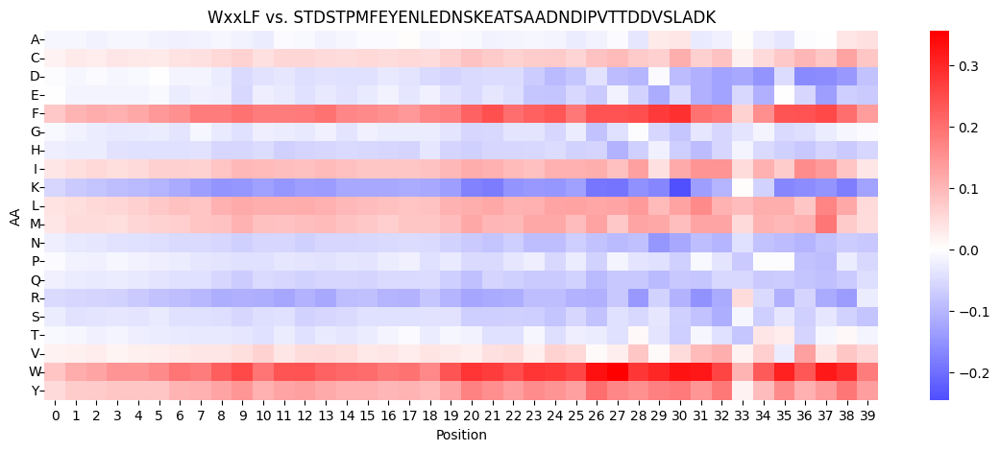

In [6]:
plot_attr(attr_wlf, title=f"WxxLF vs. {weak}")
plt.show()

In [7]:
wlf_scores = dl.attribute(torch.tensor(X[wlf]), baselines=weakAD, attribute_to_layer_input=True).detach().numpy()
print(wlf_scores.shape)


(1866, 40, 20)


In [8]:
import re
# gcn4.index("W..LF")
start, stop = re.search("W..LF", gcn4).span()
gcn4[start:stop]

'WTSLF'

In [9]:
print(gcn4[32:35])
print(weak[32:35])
print(gcn4.count("W"), gcn4.count("F"), gcn4.count("Y"), gcn4.count("L"))
print(weak.count("W"), weak.count("F"), weak.count("Y"), weak.count("L"))

DDV
DDV
1 2 1 3
0 1 1 2


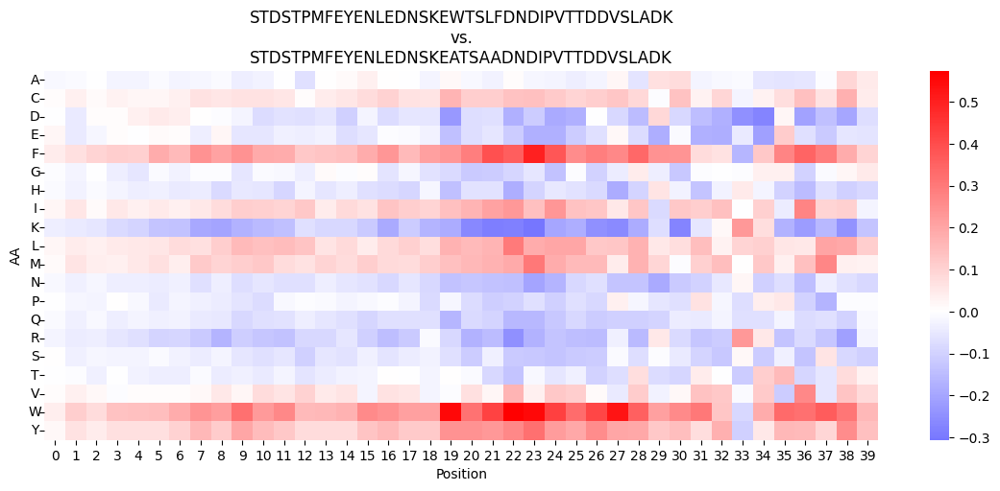

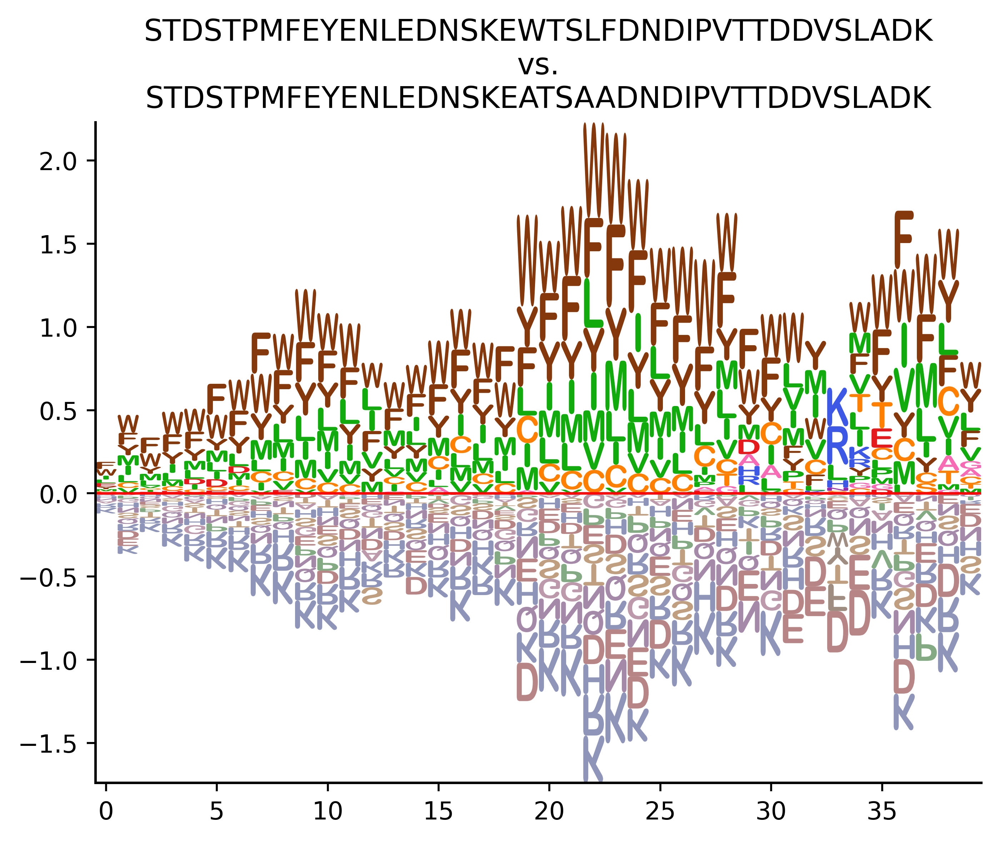

In [10]:
gcn4_vs_no_wlf = get_attr(dl, gcn4AD, weakAD)
plot_attr(gcn4_vs_no_wlf, title=f"{gcn4}\nvs.\n{weak}")
plt.show()
ax = logo_plot(gcn4_vs_no_wlf.T, title=f"{gcn4}\nvs.\n{weak}")
plt.show()
# plot_attr(gcn4_vs_no_wlf)
# plt.show()

## Full-gene importance scores
Since these are tiles over genes, compute 40x20 importance scores for each and generate
1. scatterplots / boxplots
2. Average n x 20 matrices over the whole gene

In [12]:
df.head()

,SpeciesNames,NativeLocation,NormLocation,Seq,Activity,Stdev_BYS4_BioReps,Set
0,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,20,-115,MPTNDLNSAISMFEMNVNTPGAGAAAAAAPCNPSVGAYHM,54705.618558,85.565128,train
1,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,25,-110,LNSAISMFEMNVNTPGAGAAAAAAPCNPSVGAYHMGVTPA,83953.470534,11655.231019,train
2,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,30,-105,SMFEMNVNTPGAGAAAAAAPCNPSVGAYHMGVTPAEQHEA,24826.064466,9206.743277,train
3,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,35,-100,NVNTPGAGAAAAAAPCNPSVGAYHMGVTPAEQHEALQSSA,195530.088863,NaN,train
4,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,40,-95,GAGAAAAAAPCNPSVGAYHMGVTPAEQHEALQSSASTSSS,36626.225970,NaN,train


In [13]:
def gene_importance_scores(gene, dl, baseline, model=model):   
    """
    Calculates importance scores for each AA / position along an entire gene, 
    averaging the importance scores between AA positions present in multiple
    40aa sequence windows. Assumes df and model are already defined. 
    
    Args:
        gene : Gene name in df
        dl: DeepLIFT attribution object
        baseline: Tensor corresponding to baseline for DeepLIFT
        model: Model to use. Defaults to predefined model.
    """
    
    df_gene = df[df["SpeciesNames"] == gene].copy()
    X_gene = torch.stack(list(df_gene["Seq"].apply(encode).values)).squeeze()
    # It's useful and quick to store ADHunter predictions in df_gene:
    with torch.no_grad():
        predicted_activity = model(X_gene).detach().numpy()
        # Need to unscale the predicted activity values
        activities_measured = df["Activity"].values.reshape(-1, 1)
        scaler = preprocessing.StandardScaler().fit(activities_measured)
        predicted_activity = scaler.inverse_transform(
            predicted_activity.reshape(-1, 1)
            ).flatten()
        df_gene["Predicted Activity"] = predicted_activity
    # Now let's do DeepLIFT:
    X_scores = dl.attribute(
        X_gene, baselines=baseline, attribute_to_layer_input=True
        ).detach().numpy()
    xdfs = []
    for idx, scores in enumerate(X_scores):
        xdf = pd.DataFrame(scores).T
        xdf.columns += df_gene.iloc[idx]["NativeLocation"]
        # Subtract 20 to reflect the fact that positions are the centers of the AD
        xdf.columns -= 20
        xdf.index = list(alphabet)
        xdfs.append(xdf)
    M = pd.concat(xdfs, axis=1)
    M_bar = M.T.groupby(M.columns).mean().T
    M_std = M.T.groupby(M.columns).std().T.fillna(0)
    return df_gene, M_bar, M_std

# gene_importance_scores(df["SpeciesNames"].unique()[0], dl, weakAD)

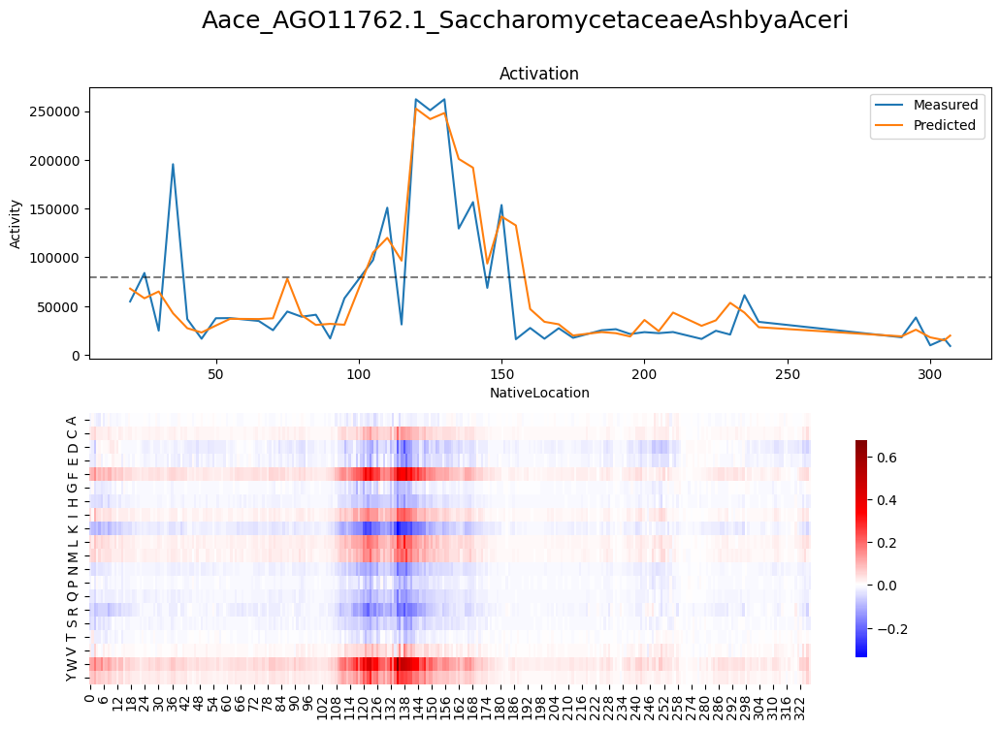

In [14]:
df_gene, M_bar, M_std = gene_importance_scores(df["SpeciesNames"].unique()[0], dl, weakAD)

fig, axs = plt.subplots(2, 1, figsize=(12,8))
sns.lineplot(df_gene, x="NativeLocation", y="Activity", ax=axs[0], label="Measured")
sns.lineplot(df_gene, x="NativeLocation", y="Predicted Activity", ax=axs[0], label="Predicted")
axs[0].axhline(80_000, c='k', alpha=0.5, linestyle="--")
axs[0].set_title("Activation")
sns.heatmap(M_bar, center=0, cmap="seismic", ax=axs[1], yticklabels=True, cbar_kws={'shrink': 0.8})
fig.suptitle(df_gene["SpeciesNames"].unique().item(), fontsize=18)
plt.show()

In [15]:
genes = df["SpeciesNames"]
genes[genes.str.contains("Sordariomycetes_jgi\|Plecucu2\|161010")].unique()

array(['Sordariomycetes_jgi|Plecucu2|161010|estExt_Genewise1.C_14_t20014'],
      dtype=object)

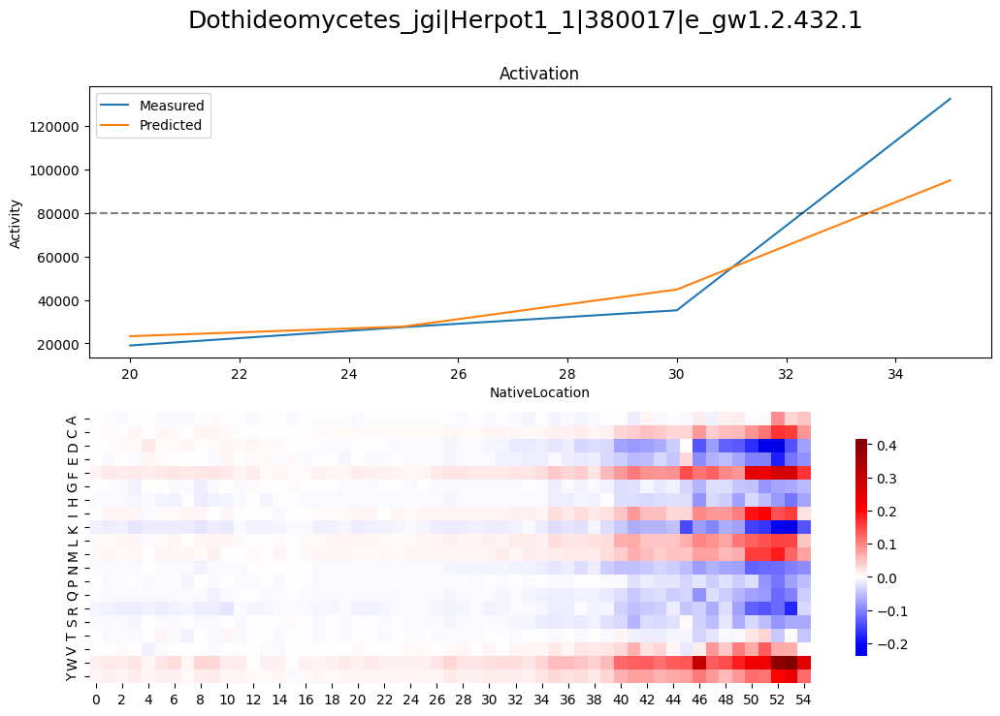

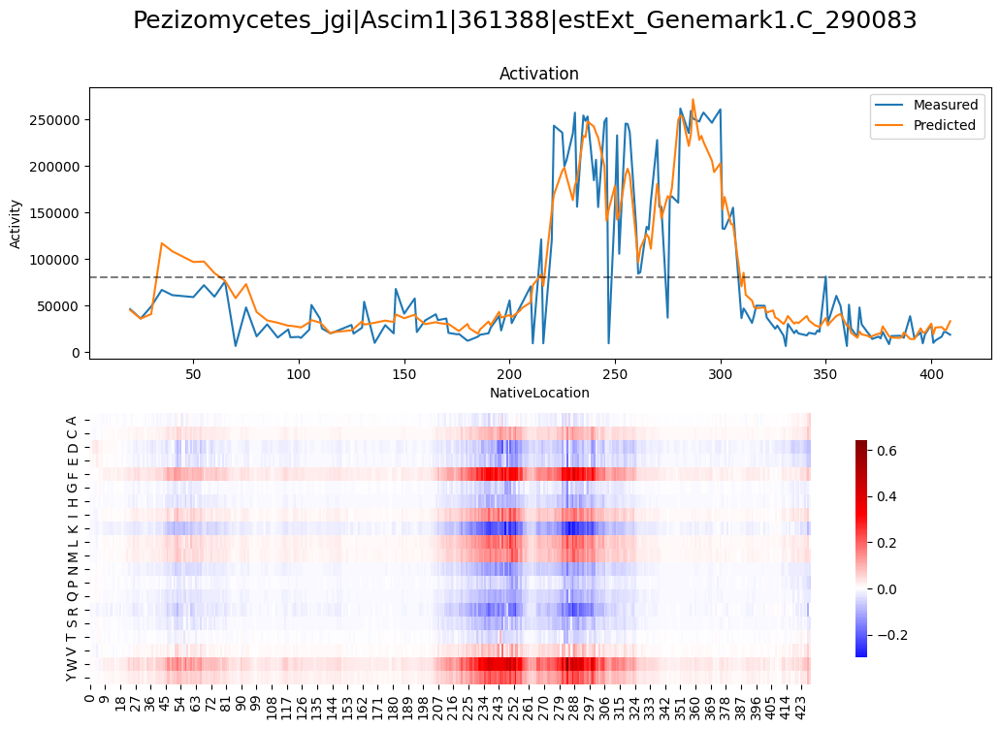

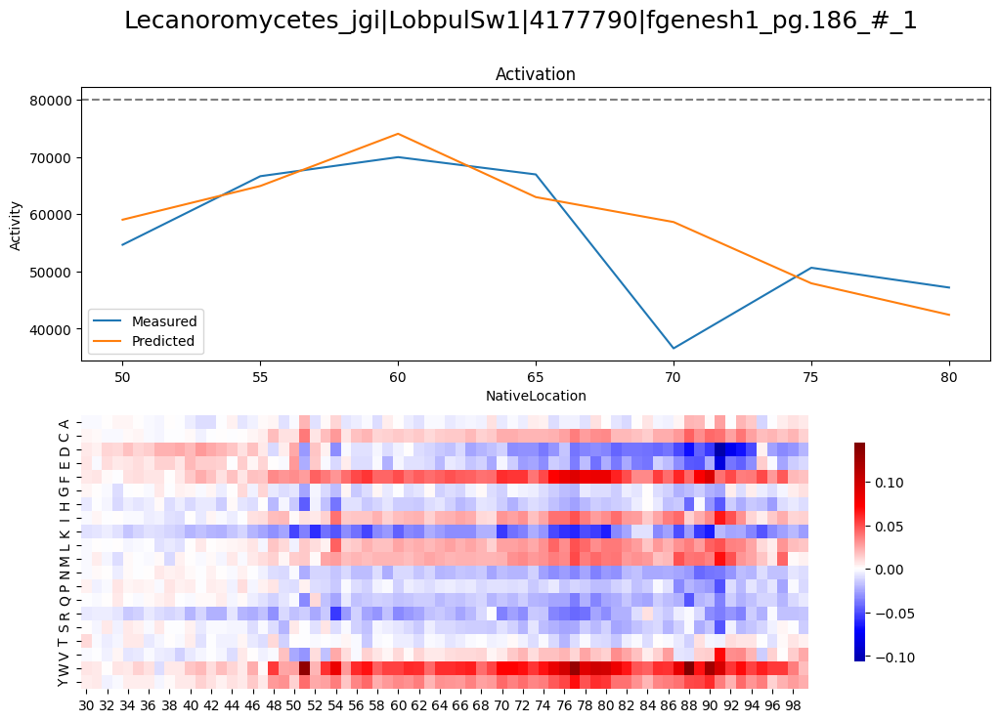

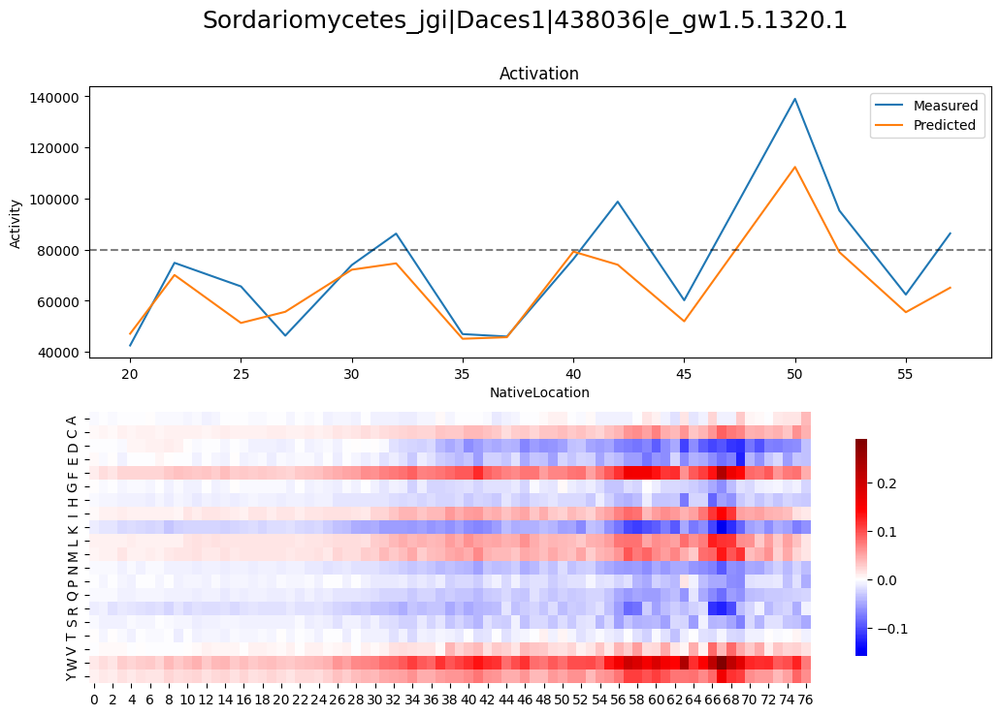

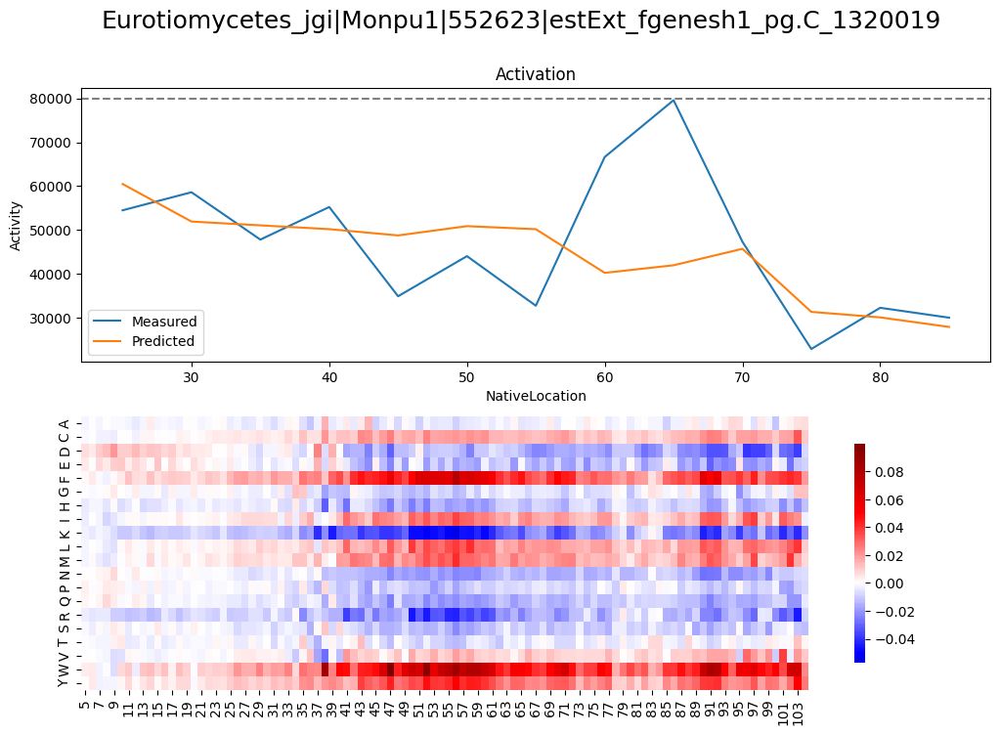

In [16]:
for idx in np.random.choice(len(df["SpeciesNames"].unique()), 5):
    gene = df["SpeciesNames"].unique()[idx]
    df_gene, M_bar, M_std = gene_importance_scores(gene, dl, weakAD)

    fig, axs = plt.subplots(2, 1, figsize=(12,8))
    sns.lineplot(df_gene, x="NativeLocation", y="Activity", ax=axs[0], label="Measured")
    sns.lineplot(df_gene, x="NativeLocation", y="Predicted Activity", ax=axs[0], label="Predicted")
    axs[0].axhline(80_000, c='k', alpha=0.5, linestyle="--")
    axs[0].set_title("Activation")
    sns.heatmap(M_bar, center=0, cmap="seismic", ax=axs[1], yticklabels=True, cbar_kws={'shrink': 0.8})
    fig.suptitle(df_gene["SpeciesNames"].unique().item(), fontsize=18)
    plt.show()


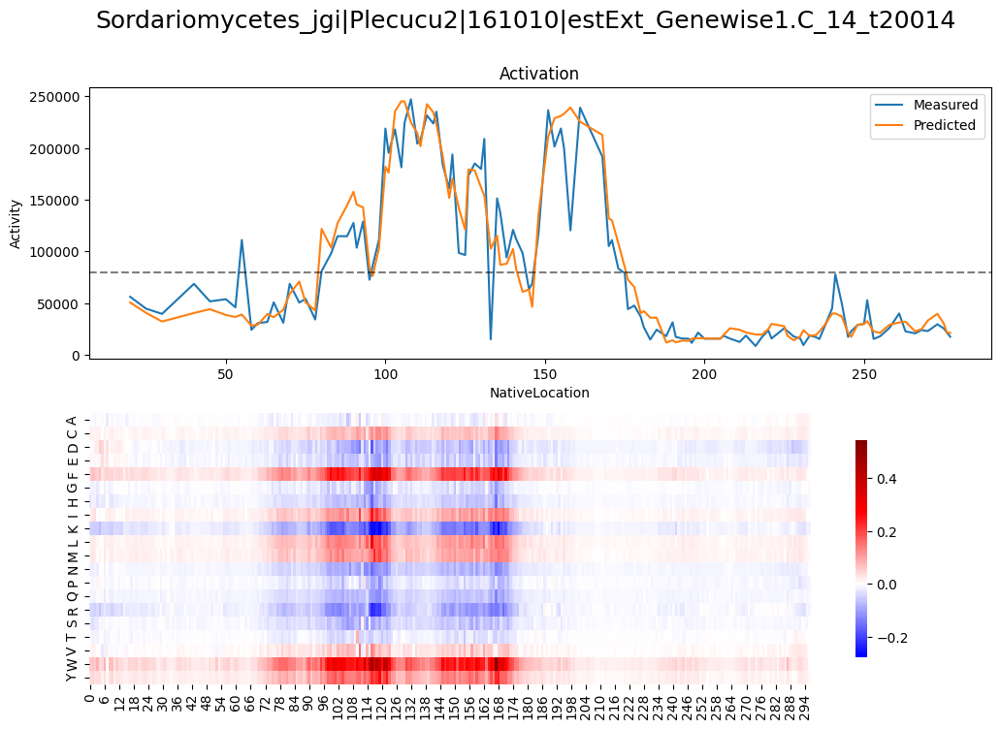

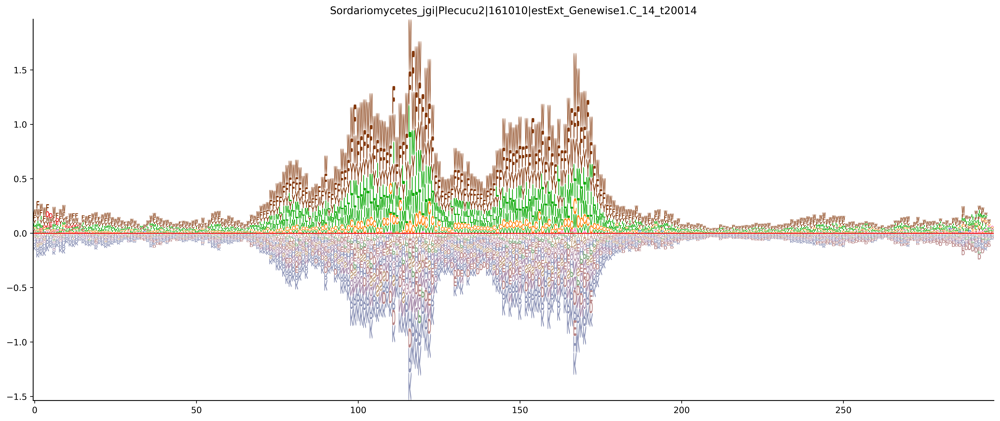

In [17]:
gene = "Sordariomycetes_jgi|Plecucu2|161010|estExt_Genewise1.C_14_t20014"
df_gene, M_bar, M_std = gene_importance_scores(gene, dl, weakAD)

fig, axs = plt.subplots(2, 1, figsize=(12,8))
sns.lineplot(df_gene, x="NativeLocation", y="Activity", ax=axs[0], label="Measured")
sns.lineplot(df_gene, x="NativeLocation", y="Predicted Activity", ax=axs[0], label="Predicted")
axs[0].axhline(80_000, c='k', alpha=0.5, linestyle="--")
axs[0].set_title("Activation")
sns.heatmap(M_bar, center=0, cmap="seismic", ax=axs[1], yticklabels=True, cbar_kws={'shrink': 0.8})
fig.suptitle(df_gene["SpeciesNames"].unique().item(), fontsize=18)
plt.show()
fig, ax = plt.subplots(figsize=(20,8), dpi=500)
logo_plot(M_bar.T, title=gene, ax=ax)
plt.show()

# Is the C effect real?
Why does it seem like ADHunter thinks Cs are more important than D and E?

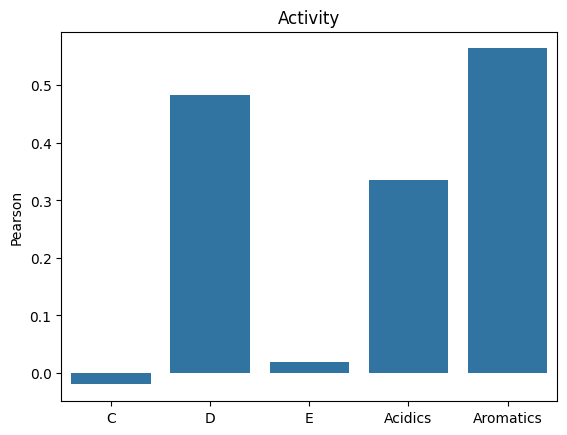

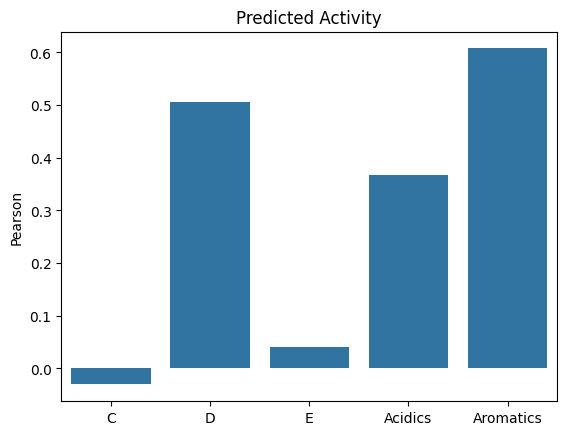

In [58]:
c_cts = df["Seq"].apply(lambda seq: seq.count("C"))
d_cts = df["Seq"].apply(lambda seq: seq.count("D"))
e_cts = df["Seq"].apply(lambda seq: seq.count("E"))
acidic_cts = df["Seq"].apply(lambda seq: seq.count("D") + seq.count("E"))
aro_cts = df["Seq"].apply(lambda seq: seq.count("W") + seq.count("F") + seq.count("Y"))

# plt.scatter(c_cts, df["Activity"])
# plt.scatter(acidic_cts, df["Activity"])
# plt.show()
sns.barplot({
    "C": c_cts.corr(df["Activity"], method='pearson'),
    "D": d_cts.corr(df["Activity"], method='pearson'),
    "E": e_cts.corr(df["Activity"], method='pearson'),
    "Acidics": acidic_cts.corr(df["Activity"], method='pearson'),
    "Aromatics": aro_cts.corr(df["Activity"], method='pearson'),
    })
plt.title("Activity")
plt.ylabel("Pearson")
plt.show()
sns.barplot({
    "C": c_cts.corr(df["Predicted Activity"], method='pearson'),
    "D": d_cts.corr(df["Predicted Activity"], method='pearson'),
    "E": e_cts.corr(df["Predicted Activity"], method='pearson'),
    "Acidics": acidic_cts.corr(df["Predicted Activity"], method='pearson'),
    "Aromatics": aro_cts.corr(df["Predicted Activity"], method='pearson'),
    })
plt.title("Predicted Activity")
plt.ylabel("Pearson")
plt.show()

# Does ADHunter really learn relevant patterns?
Sanity check that just randomly adding a bunch of aromatics won't max out ADHunter

In [18]:
X_gene = torch.stack(list(df["Seq"].apply(encode).values)).squeeze()
# It's useful and quick to store ADHunter predictions in df:
with torch.no_grad():
    predicted_activity = model(X_gene).detach().numpy()
    # Need to unscale the predicted activity values
    activities_measured = df["Activity"].values.reshape(-1, 1)
    # scaler = preprocessing.StandardScaler().fit(activities_measured)
    # predicted_activity = scaler.inverse_transform(
    #     predicted_activity.reshape(-1, 1)
    #     ).flatten()
    df["Predicted Activity"] = predicted_activity
df

,SpeciesNames,NativeLocation,NormLocation,Seq,Activity,Stdev_BYS4_BioReps,Set,Predicted Activity
0,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,20,-115,MPTNDLNSAISMFEMNVNTPGAGAAAAAAPCNPSVGAYHM,54705.618558,85.565128,train,0.031594
1,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,25,-110,LNSAISMFEMNVNTPGAGAAAAAAPCNPSVGAYHMGVTPA,83953.470534,11655.231019,train,-0.129370
2,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,30,-105,SMFEMNVNTPGAGAAAAAAPCNPSVGAYHMGVTPAEQHEA,24826.064466,9206.743277,train,-0.016613
3,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,35,-100,NVNTPGAGAAAAAAPCNPSVGAYHMGVTPAEQHEALQSSA,195530.088863,NaN,train,-0.378085
4,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,40,-95,GAGAAAAAAPCNPSVGAYHMGVTPAEQHEALQSSASTSSS,36626.225970,NaN,train,-0.626684
...,...,...,...,...,...,...,...,...
18891,Zyro_ZYRO0D09174g,170,124,CESDDPVAMKRARNTEAARRSRARKLERMSQLEERVEELL,18309.748264,NaN,train,-0.564875
18892,Zyro_ZYRO0D09174g,175,129,PVAMKRARNTEAARRSRARKLERMSQLEERVEELLAKNEE,21154.294940,NaN,train,-0.678518
18893,Zyro_ZYRO0D09174g,180,134,RARNTEAARRSRARKLERMSQLEERVEELLAKNEELEKRN,29714.906137,NaN,train,-0.770369
18894,Zyro_ZYRO0D09174g,190,144,SRARKLERMSQLEERVEELLAKNEELEKRNRQLEQRLALS,26453.058787,NaN,train,-0.571066


In [19]:
n_random = 1000
random_aromatics = ["".join(np.random.choice(list("WYF"), 40)) for _ in range(n_random)] + ["".join(["W" for _ in range(40)])]
encoded_random_aromatics = torch.stack([encode(i) for i in random_aromatics]).squeeze()
scores_random_aromatics = model(encoded_random_aromatics).detach().numpy()

# all_wlf = "".join(["WLF" for _ in range(14)])[:40]
# score_all_wlf = model(encode(all_wlf)).item()

In [20]:
all_one = lambda aa: encode("".join([aa for _ in range(40)]))
model(all_one("W"))
for aa in alphabet:
    print(f"All {aa}: {model(all_one(aa)).item()}")

All A: 0.23349761962890625
All C: 0.05746426433324814
All D: -0.9654779434204102
All E: -0.9708883762359619
All F: 0.17383572459220886
All G: -0.48938027024269104
All H: -0.47562339901924133
All I: -0.03570089489221573
All K: -0.6032001972198486
All L: -0.23711106181144714
All M: -0.2182292938232422
All N: -0.6725904941558838
All P: -0.5740645527839661
All Q: -0.7057112455368042
All R: -0.4224316477775574
All S: -0.7143705487251282
All T: -0.38273581862449646
All V: -0.21840399503707886
All W: 0.31777918338775635
All Y: 0.03431174159049988


In [21]:
# Spike aromatic clusters into miscellaneous sequences
def spike_in(n_res, choices=["W", "Y", "F"], background=["A"]):
    if type(choices) == str:
        choices = [choices]
    if type(background) == str:
        background = [background]
    seqs = []
    for i in range(40-n_res):
        # seqs.append(
        #     "".join(["A" for _ in range(i)]) + \
        #     "".join(np.random.choice(choices, n_res)) + \
        #     "".join(["A" for _ in range(40 - n_res - i)])
        # )
        seqs.append(
            "".join(np.random.choice(background, i)) + \
            "".join(np.random.choice(choices, n_res)) + \
            "".join(np.random.choice(background, 40 - n_res - i))
        )
    return seqs

phi_clusters = (
    spike_in(10, background=list(alphabet)) + \
    spike_in(5, background=list(alphabet)) + \
    spike_in(10, background=["A", "D", "E"]) + \
    spike_in(5, background=["A", "D", "E"]) + \
    spike_in(10) + \
    spike_in(5)
    )
encoded_phi_clusters = torch.stack([encode(i) for i in phi_clusters]).squeeze()
scores_phi_clusters = model(encoded_phi_clusters).detach().numpy().flatten()

/var/folders/1w/3zhjqj3d3ljgvrrqp77lpv6m0000gn/T/ipykernel_28198/2869514265.py:9: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  sns.violinplot({


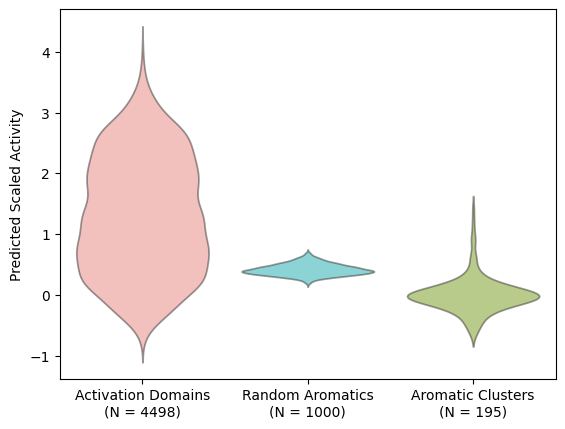

In [22]:
# sns.boxplot(df["Predicted Activity"],)

ggplot_colors = [
    "#F8766D", "#00BFC4", "#7CAE00", "#C77CFF", "#FF61CC", 
    "#00BA38", "#619CFF", "#F564E3", "#E76BF3", "#FF9E2C", 
]

df_ad = df[df["Activity"] >= 80_000]
sns.violinplot({
    f"Activation Domains\n(N = {len(df_ad)})": df_ad["Predicted Activity"], 
    f"Random Aromatics\n(N = {n_random})": scores_random_aromatics.flatten(),
    f"Aromatic Clusters\n(N = {len(phi_clusters)})": scores_phi_clusters,
    },
    inner=None, palette=ggplot_colors, alpha=.5,
    )
# sns.boxplot(scores,)
# plt.axhline(score_all_wlf, label="All WLF")
# plt.legend()
plt.ylabel("Predicted Scaled Activity")
plt.show()

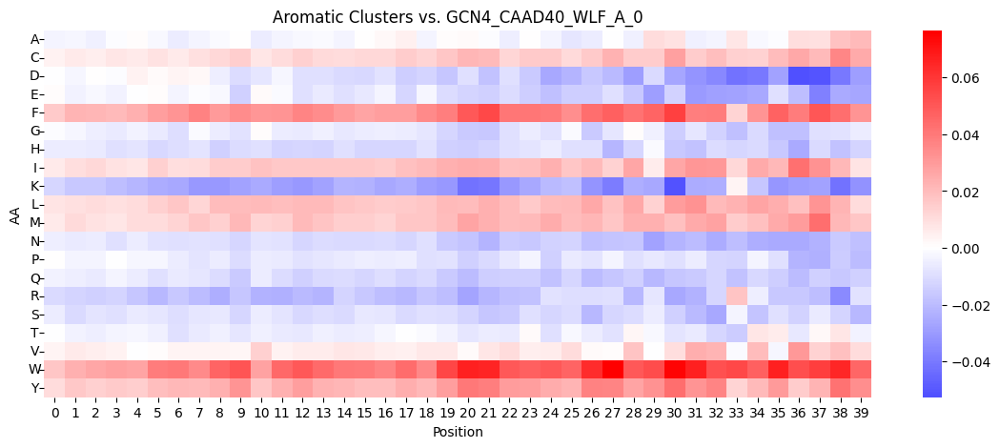

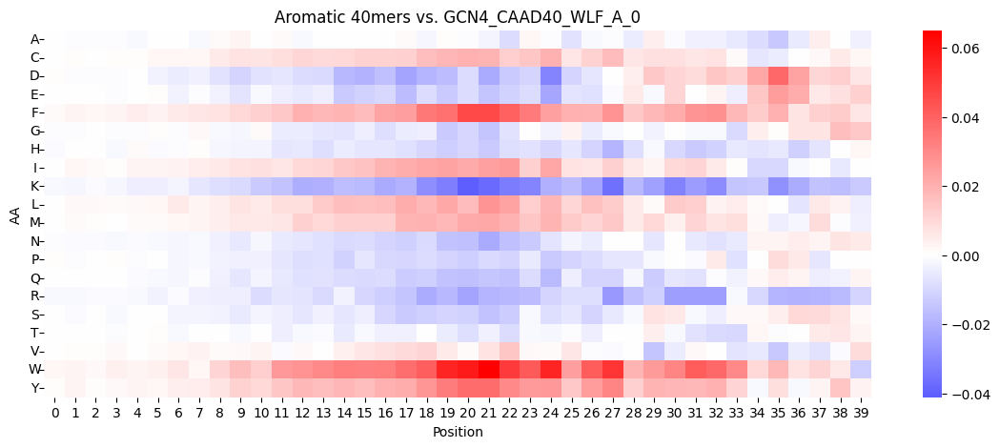

In [23]:
phi_cluster_attr = get_attr(dl, encoded_phi_clusters, weakAD)
random_aromatics_attr = get_attr(dl, encoded_random_aromatics, weakAD)

plot_attr(phi_cluster_attr, title="Aromatic Clusters vs. GCN4_CAAD40_WLF_A_0")
plt.show()
plot_attr(random_aromatics_attr, title="Aromatic 40mers vs. GCN4_CAAD40_WLF_A_0")
plt.show()

# ad_attr = get_attr(dl, df_ad["Seq"].apply(encode), weakAD)
# plot_attr(ad_attr, title="Activation Domains vs. GCN4_CAAD40_WLF_A_0")
# plt.show()

In [65]:
import torch.nn.functional as Fun
x = encode("".join(["D" for _ in range(40)]))
print(model(x))
Fun.one_hot(x, num_classes=20).float()
# model.model.emb(encode("".join(["C" for _ in range(40)])))

tensor([-0.9655], grad_fn=<ViewBackward0>)


tensor([[[0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0.,

In [24]:
"".join(["WF" for _ in range(20)])

'WFWFWFWFWFWFWFWFWFWFWFWFWFWFWFWFWFWFWFWF'

# Evaluating Performance on the Synthetics Dataset

In [25]:
synthetics = pd.read_csv(
    "../data/SynAD_Glu_Filtered_ActivityCtrlStd_replicateactivities.csv",
    index_col=0,).rename(columns={"AAseq": "Seq"})


In [26]:
X_synthetic = torch.stack(list(synthetics["Seq"].apply(encode).values)).squeeze()
synthetics["Predicted Activity"] = model(X_synthetic).detach().numpy().flatten()

In [27]:
synthetics[["Activity", "Predicted Activity"]].corr(method="spearman")

,Activity,Predicted Activity
Activity,1.000000,0.623041
Predicted Activity,0.623041,1.000000


# PREVIOUS CODE -- TAKE BITS FROM HERE AND MAKE EM NICER

In [8]:
x_scores = dl.attribute(torch.tensor(X), baselines=weakAD, attribute_to_layer_input=True).detach().numpy()

In [ ]:
df0 = df[df["SpeciesNames"] == df["SpeciesNames"].unique()[0]].copy()
display(df0.head())
# torch.tensor(df0["Seq"].apply(encode).values.astype)


,SpeciesNames,NativeLocation,NormLocation,Seq,Activity
0,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,20,-115,MPTNDLNSAISMFEMNVNTPGAGAAAAAAPCNPSVGAYHM,40288.321578
1,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,25,-110,LNSAISMFEMNVNTPGAGAAAAAAPCNPSVGAYHMGVTPA,83054.688641
2,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,30,-105,SMFEMNVNTPGAGAAAAAAPCNPSVGAYHMGVTPAEQHEA,49277.350646
3,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,40,-95,GAGAAAAAAPCNPSVGAYHMGVTPAEQHEALQSSASTSSS,16941.985045
4,Aace_AGO11762.1_SaccharomycetaceaeAshbyaAceri,45,-90,AAAAPCNPSVGAYHMGVTPAEQHEALQSSASTSSSDSSTL,14317.482226


tensor([[10, 12, 16,  ..., 19,  6, 10],
        [ 9, 11, 15,  ..., 16, 12,  0],
        [15, 10,  4,  ...,  6,  3,  0],
        ...,
        [14, 15, 14,  ..., 17,  0, 15],
        [ 8,  9,  3,  ..., 13, 15,  8],
        [11, 13,  9,  ..., 15,  9,  5]])

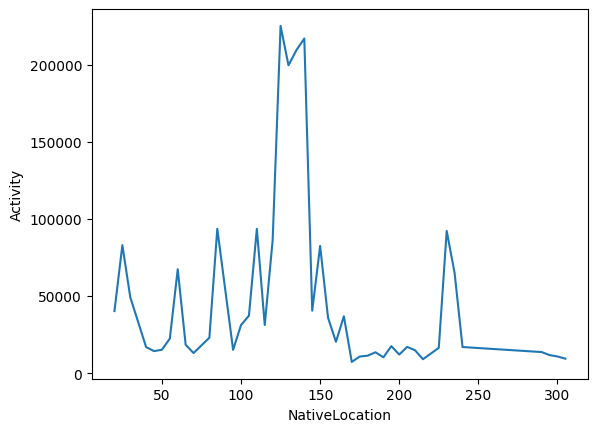

In [62]:
sns.lineplot(df0, x="NativeLocation", y="Activity")
plt.show()

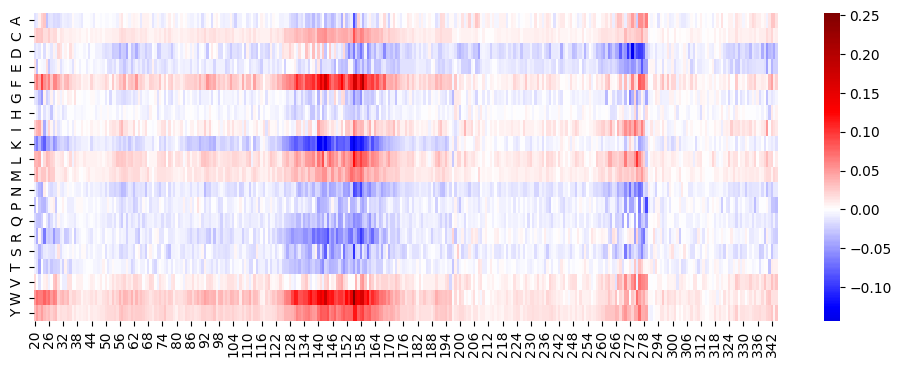

In [63]:
def get_df(df, idx):
    xdf = pd.DataFrame(x_scores[idx]).T
    xdf.columns += df.iloc[idx]["NativeLocation"]
    xdf.index = list(alphabet)
    return xdf
# THIS DOESN'T WORK CORRECTLY!!! 
M = pd.concat([get_df(df0, i) for i in range(len(df0))], axis=1,)
M_bar = M.T.groupby(M.columns).mean().T
M_std = M.T.groupby(M.columns).std().T

fig, ax = plt.subplots(figsize=(12,4))
sns.heatmap(M_bar, center=0, cmap="seismic", ax=ax)
plt.show()

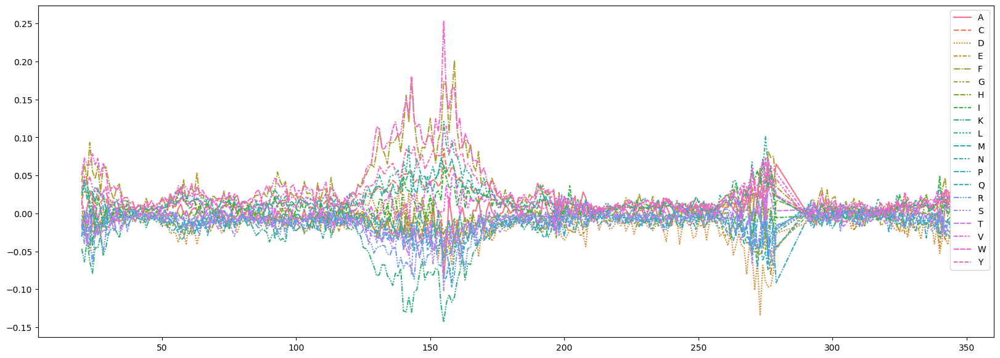

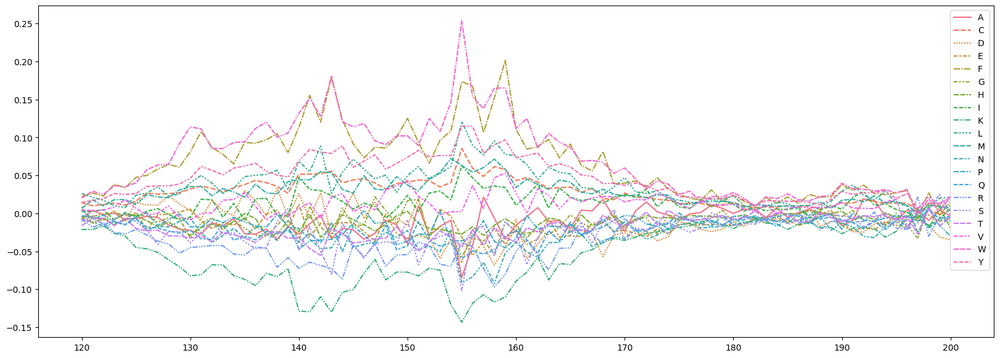

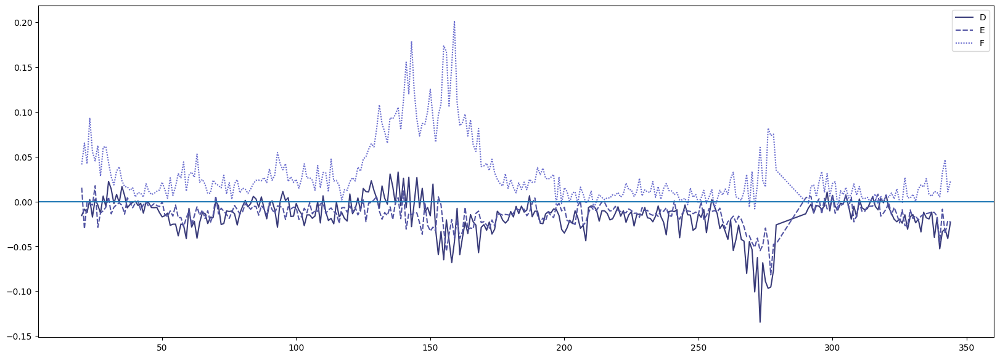

In [68]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(M_bar.T, ax=ax)
plt.show()
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(M_bar.T.loc[120:200], ax=ax)
plt.show()
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(M_bar.loc[["D", "E", "F"]].T, palette="tab20b", ax=ax)
plt.axhline(0)
plt.show()

In [65]:
import logomaker

M_bar

,20,21,22,23,24,25,26,27,28,29,...,335,336,337,338,339,340,341,342,343,344
A,-0.014885,-0.010345,0.007366,0.023271,0.028164,-0.031255,-0.015439,-0.011596,-0.017847,-0.017332,...,0.015554,0.008763,0.008847,0.002823,0.008204,-0.006382,0.013002,0.027263,0.030050,0.014731
C,0.018432,0.028856,0.027061,0.029122,0.017383,0.016363,0.025319,0.014307,0.018976,0.018918,...,0.010888,0.005121,0.010120,0.009430,0.009046,0.019127,0.012984,0.019772,0.006554,0.009984
D,-0.015633,-0.008594,-0.012160,0.002109,-0.017330,0.002544,-0.003955,-0.012904,0.006078,-0.005743,...,-0.018194,-0.019462,-0.011808,-0.040129,-0.018130,-0.052809,-0.033460,-0.030958,-0.041296,-0.022981
E,0.015481,-0.030565,-0.000789,-0.002560,-0.003956,0.017524,-0.028782,-0.012826,-0.010499,-0.006350,...,-0.013527,-0.012839,-0.011742,-0.012284,-0.016332,-0.045735,-0.008692,-0.036126,-0.021590,-0.023037
F,0.041231,0.065207,0.042106,0.093235,0.055493,0.045291,0.062426,0.028239,0.060356,0.061250,...,0.025486,0.007932,0.005811,0.011197,0.009948,0.005119,0.032228,0.046650,0.010796,0.022646
G,-0.011590,-0.016800,-0.031743,-0.049439,0.007164,-0.022685,-0.013401,0.008473,-0.014477,0.002075,...,-0.005652,0.006876,-0.016457,-0.006835,0.001059,-0.030470,-0.006948,-0.011637,-0.008870,-0.004723
H,-0.002160,-0.009528,-0.020335,0.001770,-0.015739,-0.005301,-0.008678,-0.028753,-0.005765,0.003069,...,-0.000332,-0.002570,-0.001248,-0.007189,0.001152,-0.009386,-0.025766,0.011150,-0.003741,0.005838
I,0.023418,0.035439,0.041689,0.015052,-0.041814,-0.011482,0.021110,0.004159,-0.016753,0.007198,...,0.015676,0.003000,0.004924,0.010932,0.013273,0.049978,-0.000356,0.019491,0.013894,0.010296
K,-0.046536,-0.063863,-0.035084,-0.062976,-0.079004,-0.044802,-0.045977,-0.029562,-0.054880,-0.045055,...,-0.015057,-0.003854,-0.005863,-0.000659,-0.015983,-0.001293,-0.005821,-0.011205,-0.008103,-0.016096
L,0.035563,0.036484,0.041259,-0.003386,0.018813,0.034879,0.030341,0.023534,0.019426,0.007577,...,0.021497,0.002194,0.010661,0.012775,0.019647,0.034284,0.018978,0.021594,0.000139,0.009858


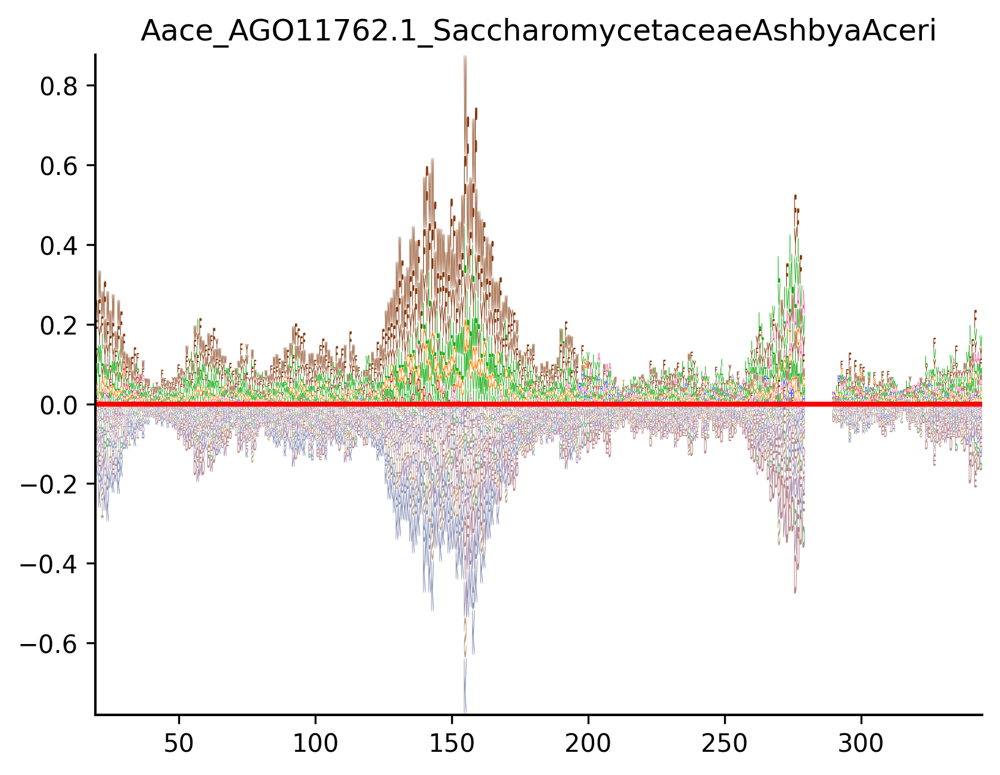

In [66]:
fig, ax = plt.subplots(dpi=300)
crp_logo = logomaker.Logo(M_bar.T,
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                          color_scheme="dmslogo_funcgroup",
                          ax=ax)
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.ax.axhline(0, c='r', linewidth=2)
crp_logo.ax.set_title(df0["SpeciesNames"].unique().item())
plt.show()

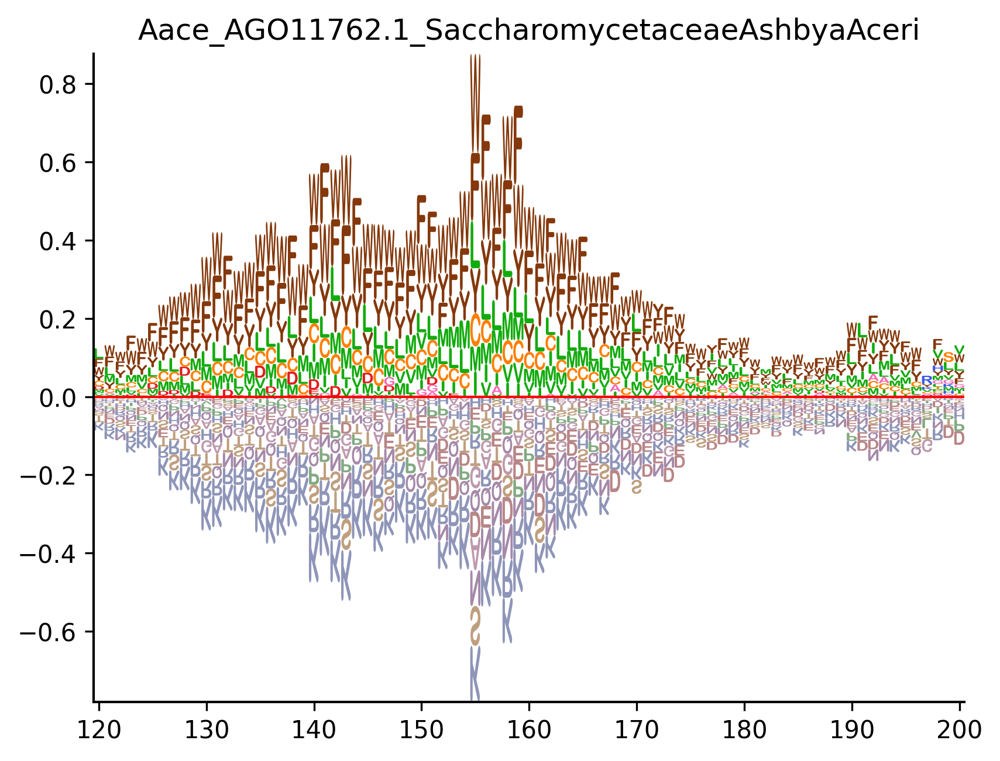

In [70]:
fig, ax = plt.subplots(dpi=300)
crp_logo = logomaker.Logo(M_bar.T.loc[120:200],
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                          color_scheme="dmslogo_funcgroup",
                          ax=ax)
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.ax.axhline(0, c='r', linewidth=1)
crp_logo.ax.set_title(df0["SpeciesNames"].unique().item())
plt.show()

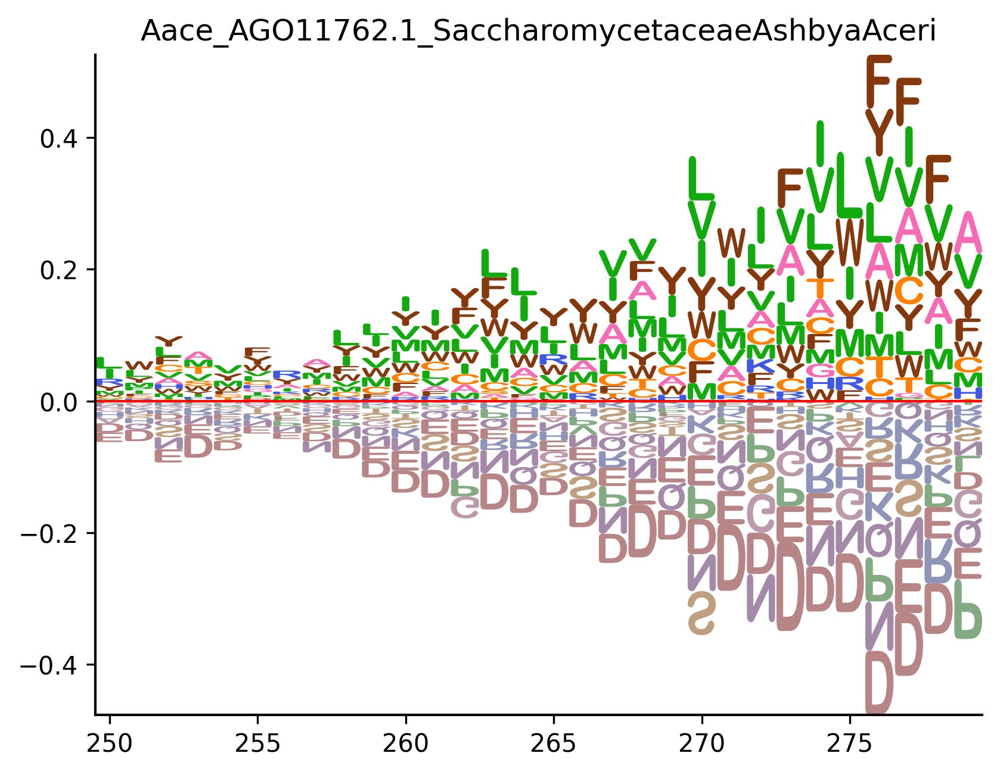

In [74]:
fig, ax = plt.subplots(dpi=300)
crp_logo = logomaker.Logo(M_bar.T.loc[250:280],
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                          color_scheme="dmslogo_funcgroup",
                          ax=ax)
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.ax.axhline(0, c='r', linewidth=1)
crp_logo.ax.set_title(df0["SpeciesNames"].unique().item())
plt.show()

'ASYNPVVSNNASASEVRGVPAPEDDFDDAMNLKMGLHGPK'

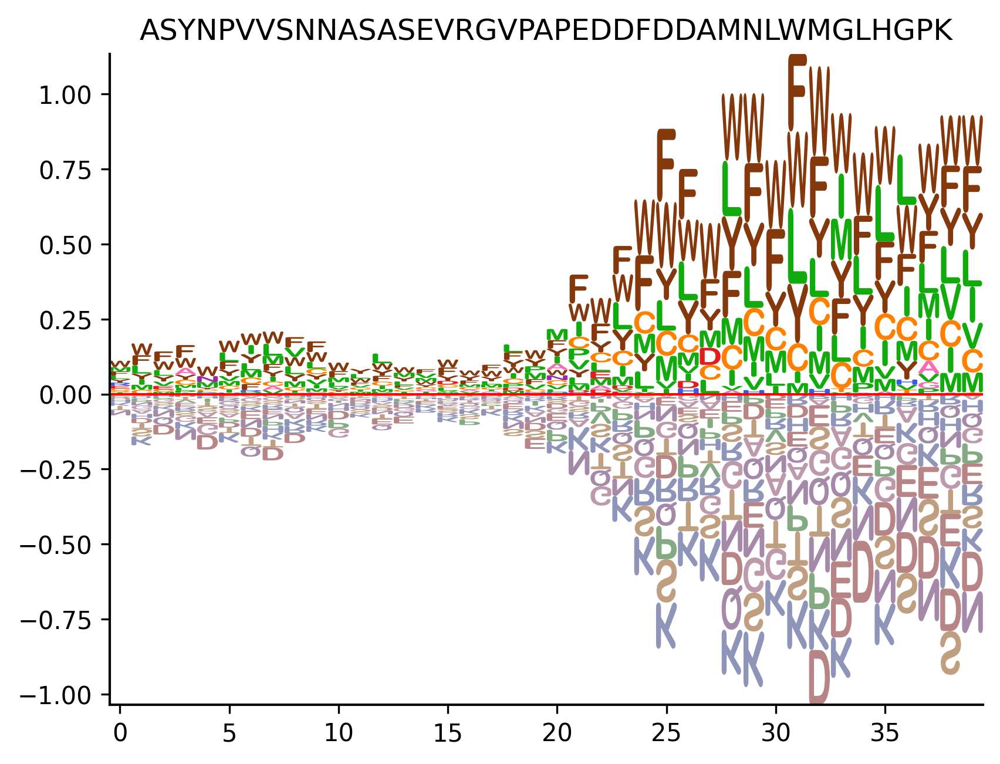

In [86]:
dl = LayerDeepLift(model, layer=model.model.emb, multiply_by_inputs=False,)

strongAD_scores = get_attr(dl, strongAD, baseline_gs)
# strongAD_scores_noW = get_attr(dl, encode(strong.replace("W", "K")), baseline_gs)
fig, ax = plt.subplots(dpi=300)
crp_logo = logomaker.Logo((strongAD_scores).T,
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                          color_scheme="dmslogo_funcgroup",
                          ax=ax)
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.ax.axhline(0, c='r', linewidth=1)
crp_logo.ax.set_title(strong)
plt.show()

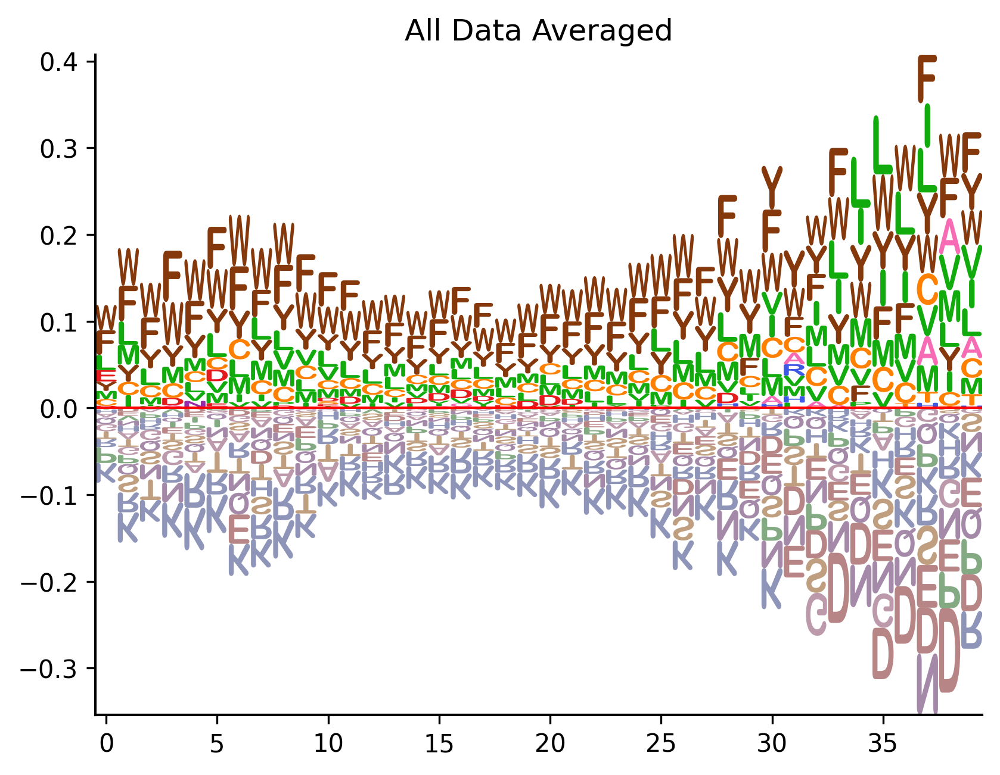

In [95]:
X_score_df = pd.DataFrame(x_scores.mean(axis=0))
X_score_df.columns = list(alphabet)

fig, ax = plt.subplots(dpi=300)
crp_logo = logomaker.Logo(X_score_df,
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                          color_scheme="dmslogo_funcgroup",
                          ax=ax)
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.ax.axhline(0, c='r', linewidth=1)
crp_logo.ax.set_title("All Data Averaged")
plt.show()

In [116]:
ad_threshold = 80_000
X_ad = torch.tensor(X[np.where(df["Activity"] >= ad_threshold)[0]])
att_ad_df_weakad = get_attr(dl, X_ad, baseline=weakAD)

# Input-wise averages for activation domains
dl_inputwise = LayerDeepLift(model, layer=model.model.emb, multiply_by_inputs=True,)
att_ad_df_weakad_inputwise = get_attr(dl_inputwise, X_ad, baseline=weakAD)


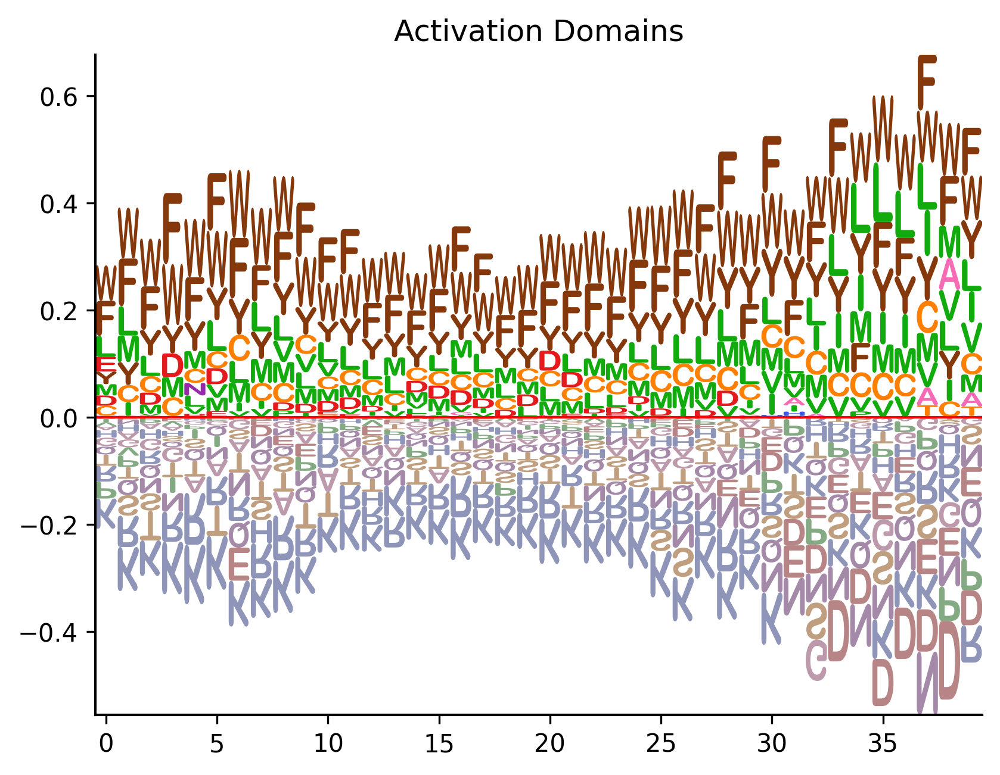

In [119]:
fig, ax = plt.subplots(dpi=300)
crp_logo = logomaker.Logo(att_ad_df_weakad.T,
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                          color_scheme="dmslogo_funcgroup",
                          ax=ax)
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.ax.axhline(0, c='r', linewidth=1)
crp_logo.ax.set_title("Activation Domains")
plt.show()
# fig, ax = plt.subplots(dpi=300)
# crp_logo = logomaker.Logo(att_ad_df_weakad_inputwise.T,
#                           shade_below=.5,
#                           fade_below=.5,
#                           font_name='Arial Rounded MT Bold',
#                           color_scheme="dmslogo_funcgroup",
#                           ax=ax)
# crp_logo.style_spines(visible=False)
# crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
# crp_logo.ax.axhline(0, c='r', linewidth=1)
# crp_logo.ax.set_title("Activation Domains (multiply by inputs)")
# plt.show()